In [1]:
import warnings
warnings.filterwarnings('ignore')
from encoding import *
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from skimage.io import imread
from skimage.segmentation import mark_boundaries
from skimage.util import montage
from skimage.morphology import label
from PIL import Image

### Exploring the data

In [2]:
# Train and test directories
train_image_dir = 'airbus_ship_detection_unet/train_v2'
test_image_dir = "airbus_ship_detection_unet/test_v2"
# Getting into train directory
train_images = os.listdir(train_image_dir)
test_images = os.listdir(test_image_dir)
train_images.sort()
print(f"Total of {len(train_images)} images in train directory.\nHere the first five train_images names:- {train_images[:5]}")
print(f"Total of {len(test_images)} images in test directory.\nHere the first five train_images names:- {test_images[:5]}")

Total of 192556 images in train directory.
Here the first five train_images names:- ['00003e153.jpg', '0001124c7.jpg', '000155de5.jpg', '000194a2d.jpg', '0001b1832.jpg']
Total of 15606 images in test directory.
Here the first five train_images names:- ['c677b923d.jpg', '70f933b1a.jpg', '6efd40b2c.jpg', '75004aaf3.jpg', '7ae269875.jpg']


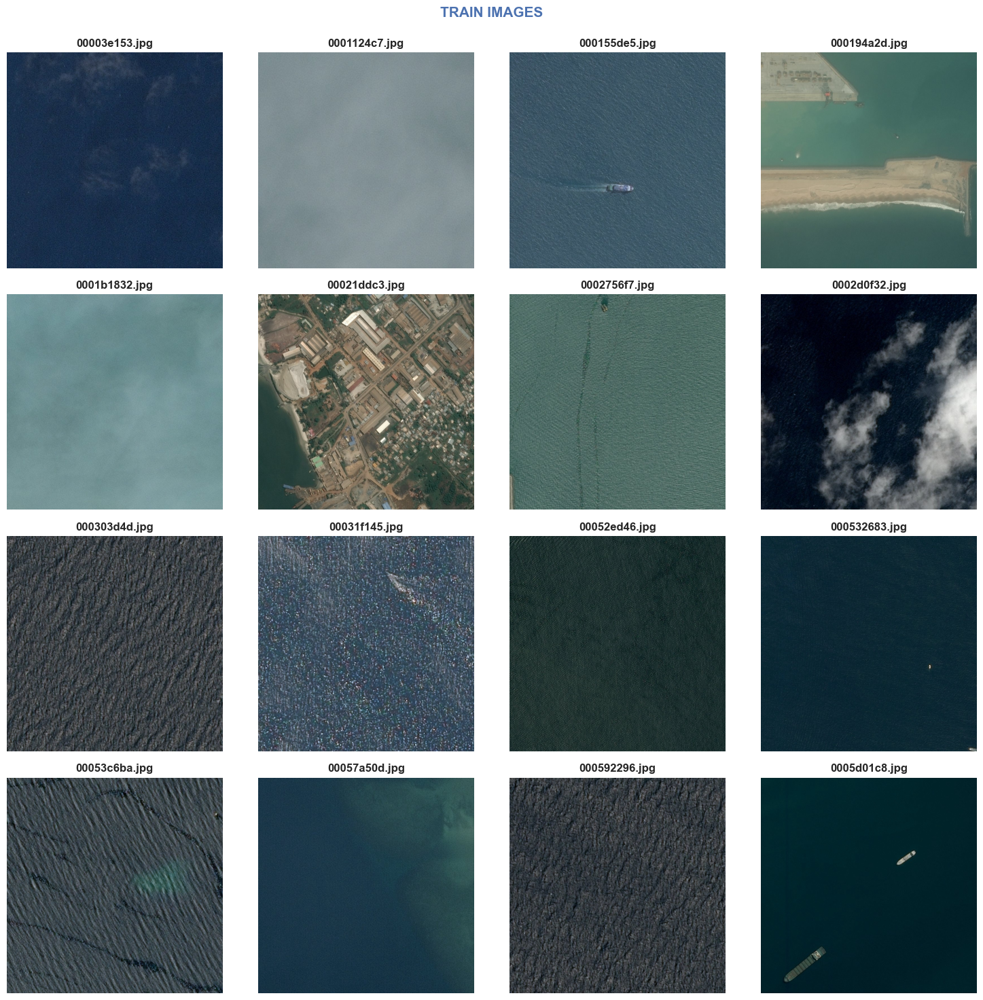

In [3]:
# Using for loop to generate different images to understand how data looks like
sns.set()
%matplotlib inline
plt.figure(figsize=(15,15))
plt.suptitle('TRAIN IMAGES\n', weight = 'bold', fontsize = 15, color = 'b')
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(imread(train_image_dir + "/" + train_images[i]))
    plt.title(f"{train_images[i]}", weight = 'bold')
    plt.axis('off')
plt.tight_layout()

The training dataset consists of satellite images, and upon initial examination, it's apparent that a significant portion of these images do not feature ships. This observation highlights the need for a deeper exploration into the distribution of ship presence within the dataset.


### Exploring the size of image

In [4]:
def get_image_shape(image_dir, image_name):
    image_path = os.path.join(image_dir, image_name)
    image = Image.open(image_path)
    return image.size  # Returns a tuple (width, height)

# Get shapes of sample images from train and test directories
train_sample_shape = get_image_shape(train_image_dir, train_images[0])
test_sample_shape = get_image_shape(test_image_dir, test_images[0])

# Display shapes
print("Dimension of sample image from train directory:", train_sample_shape)
print("Dimension of sample image from test directory:", test_sample_shape)

Dimension of sample image from train directory: (768, 768)
Dimension of sample image from test directory: (768, 768)


All images in both the train and test directories have the same dimensions, specifically (768, 768). This consistent shape is demonstrated by examining the first examples in both directories

### Explloring the mask


In [5]:
masks = pd.read_csv("airbus_ship_detection_unet/train_ship_segmentations_v2.csv")
masks.head(10)

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...
5,000194a2d.jpg,198320 10 199088 10 199856 10 200624 10 201392...
6,000194a2d.jpg,55683 1 56451 1 57219 1 57987 1 58755 1 59523 ...
7,000194a2d.jpg,254389 9 255157 17 255925 17 256693 17 257461 ...
8,0001b1832.jpg,NaN
9,00021ddc3.jpg,108287 1 109054 3 109821 4 110588 5 111356 5 1...


In [6]:
# Print the length of the DataFrame
print("Length of DataFrame masks:", len(masks))

Length of DataFrame masks: 231723


In the provided DataFrame, we observe that certain image IDs are repeated. This repetition occurs because multiple masks are provided for each ship within a single image. Consequently, the count of repeated image IDs within this DataFrame corresponds to the total number of ships present in the respective training images. The presence of 'NaN' values in the 'EncodedPixels' column indicates that no ships are present in the corresponding images.

In [7]:
# Add a new feature 'ships' to the masks DataFrame
masks['ships'] = masks['EncodedPixels'].apply(lambda x: 1 if isinstance(x, str) else 0)

# Create a new DataFrame with unique image IDs and their corresponding ship counts
unique_img_ids = masks.groupby('ImageId')['ships'].sum().reset_index()

# Adding a new feature 'has_ship' to indicate whether a ship exists in an image
unique_img_ids['has_ship'] = (unique_img_ids['ships'] > 0).astype(float)

# Increment the index by 1 (optional)
unique_img_ids.index += 1

# Display the first few rows of the new DataFrame
unique_img_ids.head(10)


,ImageId,ships,has_ship
1,00003e153.jpg,0,0.0
2,0001124c7.jpg,0,0.0
3,000155de5.jpg,1,1.0
4,000194a2d.jpg,5,1.0
5,0001b1832.jpg,0,0.0
6,00021ddc3.jpg,9,1.0
7,0002756f7.jpg,2,1.0
8,0002d0f32.jpg,0,0.0
9,000303d4d.jpg,0,0.0
10,00031f145.jpg,1,1.0


In [8]:
# Maximum number of ships
max_ships = unique_img_ids['ships'].max()
print("Maximum number of ships:", max_ships)

Maximum number of ships: 15


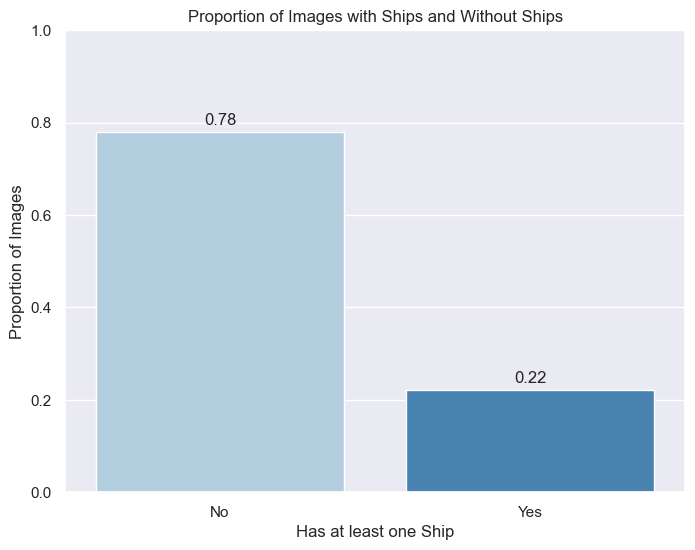

In [9]:
# Calculate the proportion of images with ships and without ships
ship_counts = unique_img_ids['has_ship'].value_counts()
total_images = ship_counts.sum()
proportions = ship_counts / total_images

# Plot the proportion of images with ships and without ships
plt.figure(figsize=(8, 6))
ax = sns.barplot(x=proportions.index, y=proportions.values, palette="Blues")

# Annotate each bar with its proportion
for index, value in enumerate(proportions.values):
    plt.text(index, value + 0.01, f'{value:.2f}', ha='center', va='bottom')

plt.title('Proportion of Images with Ships and Without Ships')
plt.xlabel('Has at least one Ship')
plt.ylabel('Proportion of Images')
plt.xticks([0, 1], ['No', 'Yes'])
plt.ylim(0, 1)  # Set y-axis limit to ensure the full range of proportions is visible
plt.show()


The visualization above reveals a significant class imbalance within the dataset, with approximately 78% of the images in the training directory devoid of ships. This heavy imbalance may potentially impact the performance of machine learning models trained on this data and warrants careful consideration during model development and evaluation

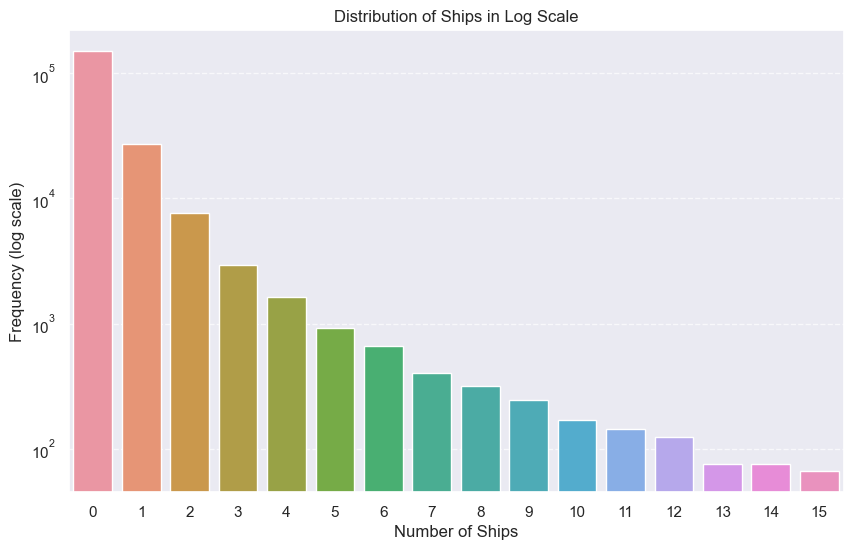

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of ships with a logarithmic scale using seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=unique_img_ids['ships'].value_counts().index, y=unique_img_ids['ships'].value_counts().values)
plt.title('Distribution of Ships in Log Scale')
plt.xlabel('Number of Ships')
plt.ylabel('Frequency (log scale)')
plt.yscale('log')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


In [11]:
ships = unique_img_ids['ships'].value_counts()
ships

ships
0     150000
1      27104
2       7674
3       2954
4       1622
5        925
6        657
7        406
8        318
9        243
10       168
11       144
12       124
14        76
13        75
15        66
Name: count, dtype: int64

### Mask exploration
Mask for each img is encoded in Run Length Encoding (RLE) format

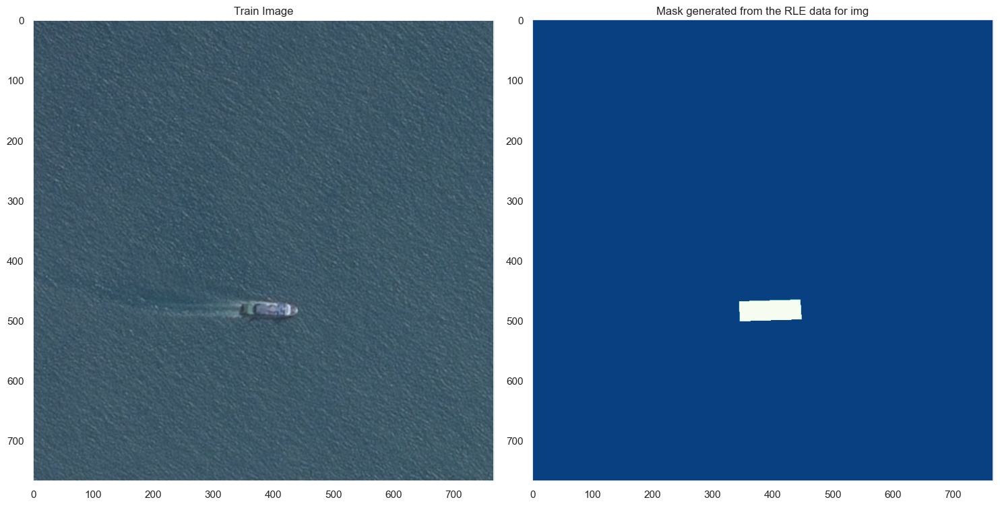

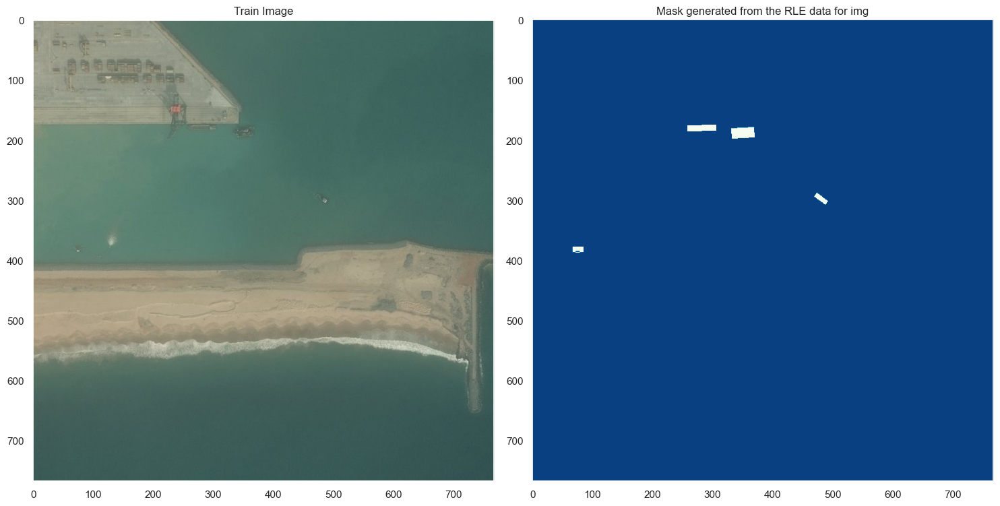

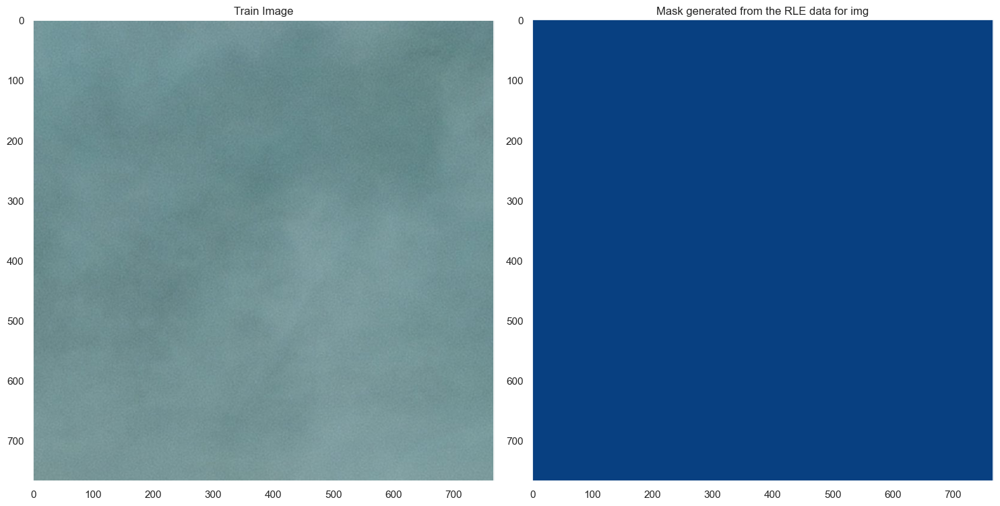

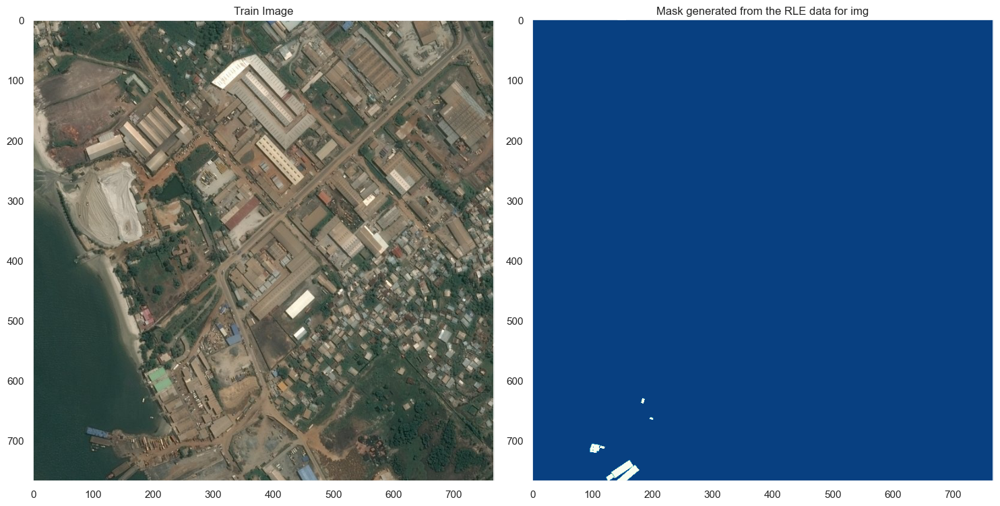

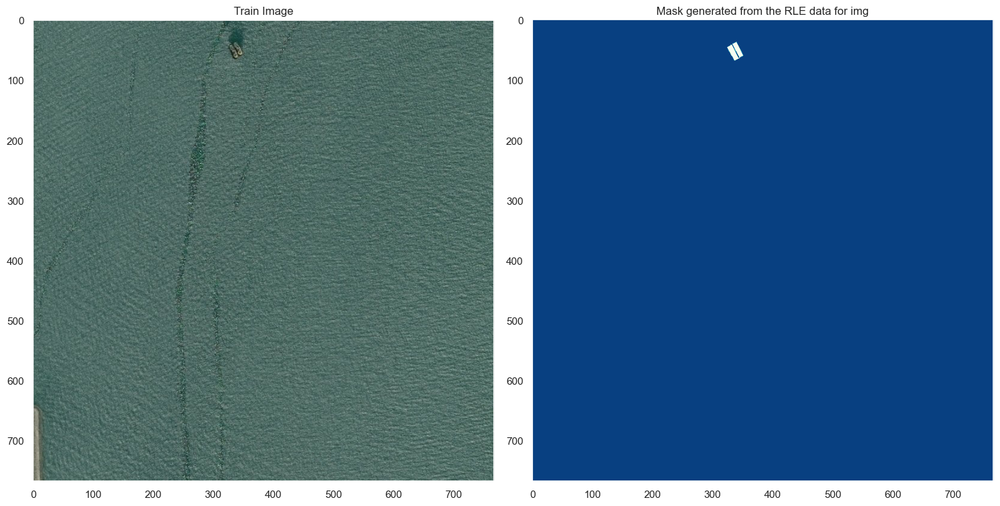

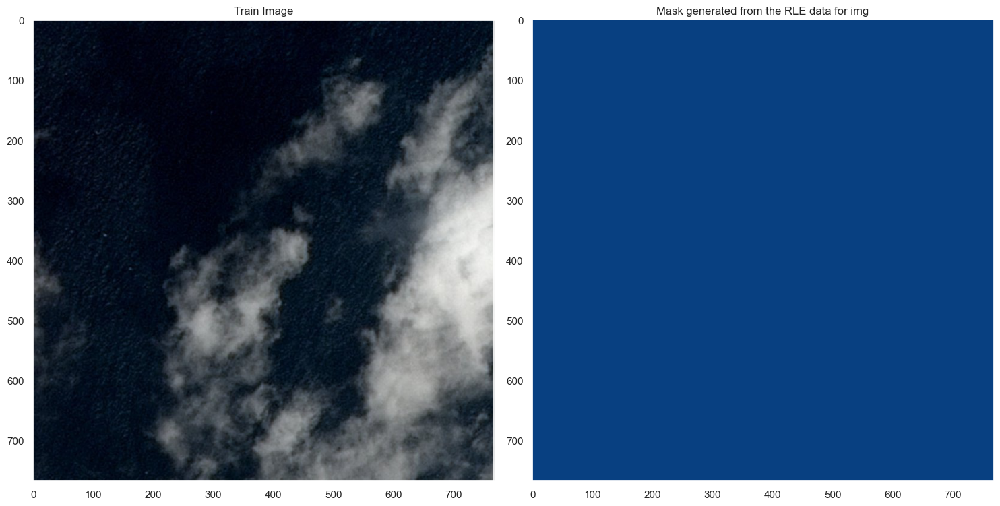

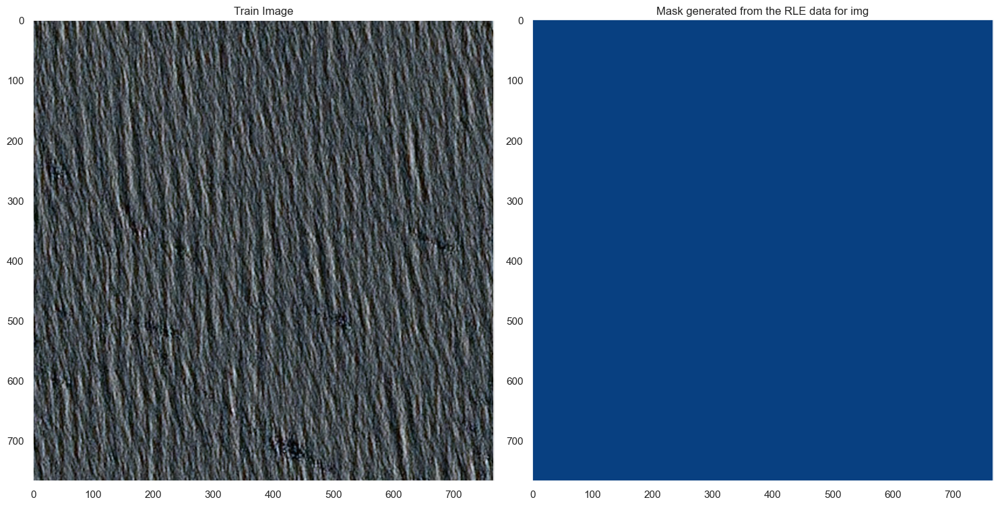

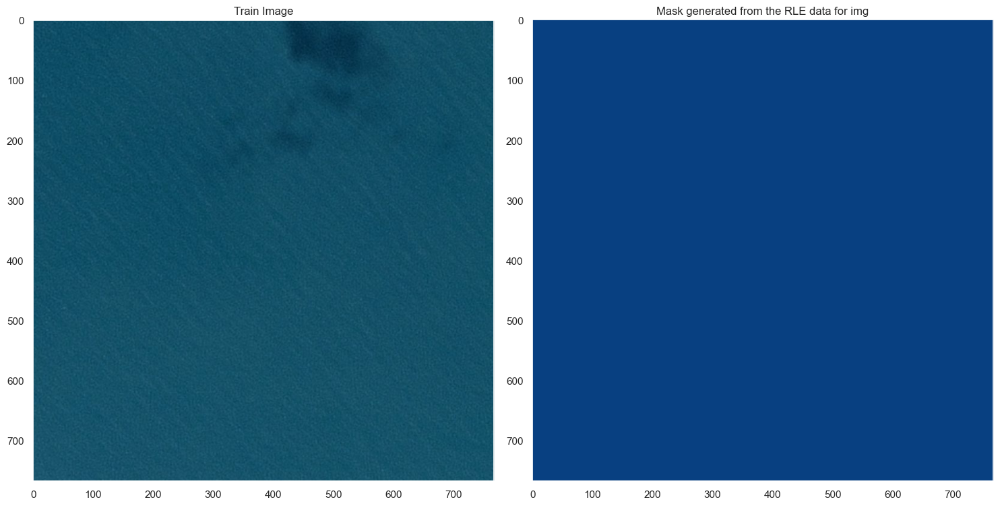

In [12]:
%matplotlib inline
sns.set()

for num in [3, 4, 5, 6, 7, 8, 20, 22]:
    rle_0 = masks.query(f'ImageId=="{train_images[num-1]}"')['EncodedPixels']
    img_0 = masks_as_image(rle_0)
    original = imread(train_image_dir+"/"+train_images[num-1])
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.title("Train Image")
    plt.imshow(original)
    plt.grid(False)
    plt.subplot(1, 2, 2)
    plt.title("Mask generated from the RLE data for img")
    plt.imshow(img_0, cmap = "GnBu_r")
    plt.tight_layout()
    plt.grid(False)
    plt.show()